<table>
<tr><td><img style="height: 150px;" src="images/geo_hydro1.jpg"></td>
<td bgcolor="#FFFFFF">
    <p style="font-size: xx-large; font-weight: 900; line-height: 100%">AG Dynamics of the Earth</p>
    <p style="font-size: large; color: rgba(0,0,0,0.5);">Jupyter notebooks</p>
    <p style="font-size: large; color: rgba(0,0,0,0.5);">Georg Kaufmann</p>
    </td>
</tr>
</table>

# Angewandte Geophysik II: Kap 7: Geoelectrics
# Potential for single electrode
----
*Georg Kaufmann,
Geophysics Section,
Institute of Geological Sciences,
Freie Universität Berlin,
Germany*

We first import libraries we will need. This time, besides the standard `numpy` and `matplotlib`
libraries, we need special functions from the `scipy` package.

In [8]:
# import libraries
import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np

import matplotlib.animation as animation
import matplotlib.image as mpimg
from IPython.display import HTML
import glob

----
## Electical potential for single electrode

For a single electrode in a **half-space**, the **electical potential** $U$ [V] is given as:
$$
U(r) = \frac{I \rho}{2\pi r}
$$
with
- $I$ [A] current
- $\rho$ [$\Omega$m] resistivity
- $r$ [m] radial distance from electrode

In [2]:
x = np.linspace(-50,50,101)
z = np.linspace(-20,0.1,101)

X,Z = np.meshgrid(x,z)

R = np.sqrt(X**2+Z**2)

In [3]:
I1 = 50    # mA
I2 = 50    # mA
rho1 = 200 # Ohmm
rho2 = 2000 # Ohmm

U1 = rho1*I1 / (2*np.pi*R)
U2 = rho2*I2 / (2*np.pi*R)

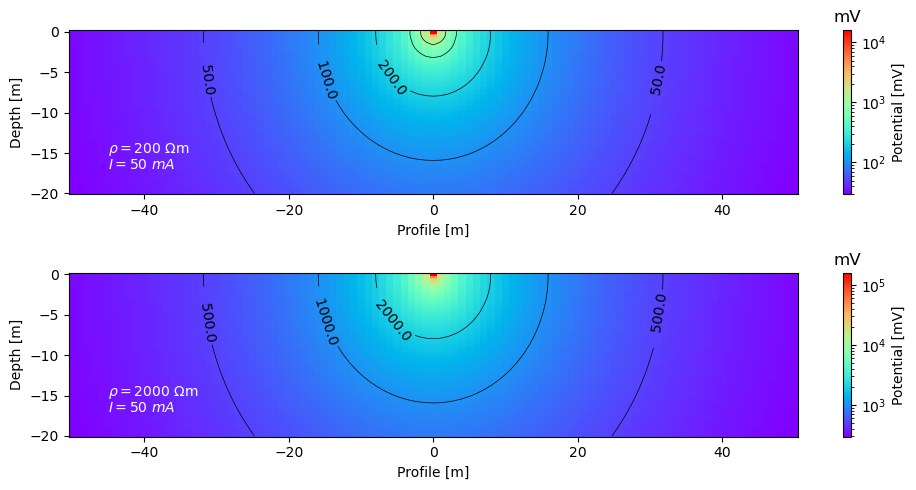

In [4]:
fig,axs = plt.subplots(2,1,figsize=(10,5))
# image and contours
axs[0].set_xlabel('Profile [m]')
axs[0].set_ylabel('Depth [m]')
im1=axs[0].pcolormesh(X,Z,U1, cmap = plt.get_cmap('rainbow'),norm=matplotlib.colors.LogNorm())
CS1=axs[0].contour(X,Z,U1, levels=[10,20,50,100,200,500,1000], linewidths = 0.5, colors = 'k',norm=matplotlib.colors.LogNorm())
plt.clabel(CS1, inline=1, fontsize=10,fmt='%8.1f')
cbar1=fig.colorbar(im1,ax=axs[0])
cbar1.ax.set_title('mV')
cbar1.set_label('Potential [mV]')
axs[0].text(-45,-15,'$\\rho=$'+str(rho1)+' $\Omega$m',color='white')
axs[0].text(-45,-17,'$I=$'+str(I1)+' $mA$',color='white')

axs[1].set_xlabel('Profile [m]')
axs[1].set_ylabel('Depth [m]')
im2=axs[1].pcolormesh(X,Z,U2, cmap = plt.get_cmap('rainbow'),norm=matplotlib.colors.LogNorm())
CS2=axs[1].contour(X,Z,U2, levels=[10,20,50,100,200,500,1000,2000], linewidths = 0.5, colors = 'k',norm=matplotlib.colors.LogNorm())
plt.clabel(CS2, inline=1, fontsize=10,fmt='%8.1f')
cbar2=fig.colorbar(im2,ax=axs[1])
cbar2.ax.set_title('mV')
cbar2.set_label('Potential [mV]')
axs[1].text(-45,-15,'$\\rho=$'+str(rho2)+' $\Omega$m',color='white')
axs[1].text(-45,-17,'$I=$'+str(I2)+' $mA$',color='white')

plt.tight_layout()
plt.savefig('SingleElectrode.png',dpi=300)


----
## Survey

Create a survey with $nelectrodes$ electrodes and $klayers$ depth. Use a Wenner scheme to mark all possible single
measurements.

In [5]:
# create 2D array for all A-M-N-B configurations per depth layer and store
nelectrodes  = 25
klayers      = 7
array = np.zeros((0,6))
for k in range(1,klayers+1):
    for n in range(1,nelectrodes+1):
        if (n+3*k <= nelectrodes):
            A = n
            M = n+1*k
            N = n+2*k
            B = n+3*k
            C = 0.25*(A+M+N+B)
            array = np.append(array,[[k,A,M,N,B,C]],axis=0)
#print(array)

In [6]:
# loop over all depth layers, and configuations per depth layer, create plot and save
for j in range(array.shape[0]):
    filename = 'ert_array/'+f'{j:03}'+'.jpg'
    fig,ax = plt.subplots(1,1,figsize=(10,4))
    ax.set_xlim([0,nelectrodes+1])
    ax.set_ylim([-0.2,8])
    ax.set_xlabel('Profile [m]')
    ax.set_ylabel('Depth layer')
    ax.invert_yaxis()
    for i in range(array.shape[0]):
        ax.plot(array[i,1],0,lw=0,marker='o',markersize=10,color='grey')
        ax.plot(array[i,2],0,lw=0,marker='o',markersize=10,color='grey')
        ax.plot(array[i,3],0,lw=0,marker='o',markersize=10,color='grey')
        ax.plot(array[i,4],0,lw=0,marker='o',markersize=10,color='grey')
        if (i > j):
            ax.plot(array[i,5],array[i,0],lw=0,marker='*',markersize=15,color='grey',alpha=0.2)
        else:
            ax.plot(array[i,5],array[i,0],lw=0,marker='*',markersize=15,color='grey',alpha=1.0)
    ax.plot(array[j,1],0,lw=0,marker='o',markersize=15,color='red')
    ax.plot(array[j,2],0,lw=0,marker='o',markersize=15,color='blue')
    ax.plot(array[j,3],0,lw=0,marker='o',markersize=15,color='blue')
    ax.plot(array[j,4],0,lw=0,marker='o',markersize=15,color='red')
    ax.plot(array[j,5],array[j,0],lw=0,marker='*',markersize=25,color='green')
    plt.savefig(filename)
    plt.close()

In [12]:
# get all plots created an compile to animated sequence
imageList = sorted(glob.glob("ert_array/0*.jpg"))
#print(imageList)

# define figure handle and empty array for list of figures    
fig = plt.figure(figsize=(15,5))
ims = []
# loop over all figures, load them into image and apprend to array ims
for i in range(len(imageList)):
    image = mpimg.imread(imageList[i])
    img=plt.imshow(image)
    plt.axis('off')
    #print(i,getImageFromList(i))
    ims.append([img])
print('assembled images to list')

# create an animation object
ani = animation.ArtistAnimation(fig, ims, interval=500, blit=True, repeat=False)
print('created animation sequence')
plt.close()
print('opening in web browser ...')
HTML(ani.to_jshtml())

assembled images to list
created animation sequence
opening in web browser ...


... done